In [1]:
import nibabel as nib
#from monai.transforms import Compose, LoadImaged, AddChanneld, ToTensord
from monai.inferers import sliding_window_inference
from monai.networks.nets import UNet
from monai.data import Dataset, DataLoader
import torch

Unique label values: [0.000e+00 2.000e+00 4.000e+00 5.000e+00 7.000e+00 8.000e+00 1.000e+01
 1.100e+01 1.200e+01 1.300e+01 1.400e+01 1.500e+01 1.600e+01 1.700e+01
 1.800e+01 2.400e+01 2.600e+01 2.800e+01 3.100e+01 4.100e+01 4.300e+01
 4.400e+01 4.600e+01 4.700e+01 4.900e+01 5.000e+01 5.100e+01 5.200e+01
 5.300e+01 5.400e+01 5.800e+01 6.000e+01 6.300e+01 7.700e+01 1.002e+03
 1.003e+03 1.005e+03 1.006e+03 1.007e+03 1.008e+03 1.009e+03 1.010e+03
 1.011e+03 1.012e+03 1.013e+03 1.014e+03 1.015e+03 1.016e+03 1.017e+03
 1.018e+03 1.019e+03 1.020e+03 1.021e+03 1.022e+03 1.023e+03 1.024e+03
 1.025e+03 1.026e+03 1.027e+03 1.028e+03 1.029e+03 1.030e+03 1.031e+03
 1.034e+03 1.035e+03 2.002e+03 2.003e+03 2.005e+03 2.006e+03 2.007e+03
 2.008e+03 2.009e+03 2.010e+03 2.011e+03 2.012e+03 2.013e+03 2.014e+03
 2.015e+03 2.016e+03 2.017e+03 2.018e+03 2.019e+03 2.020e+03 2.021e+03
 2.022e+03 2.023e+03 2.024e+03 2.025e+03 2.026e+03 2.027e+03 2.028e+03
 2.029e+03 2.030e+03 2.031e+03 2.034e+03 2.035e+03]


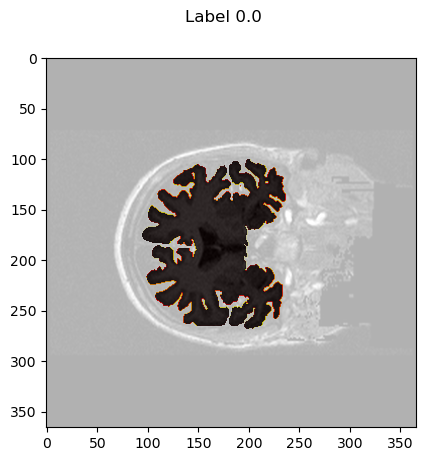

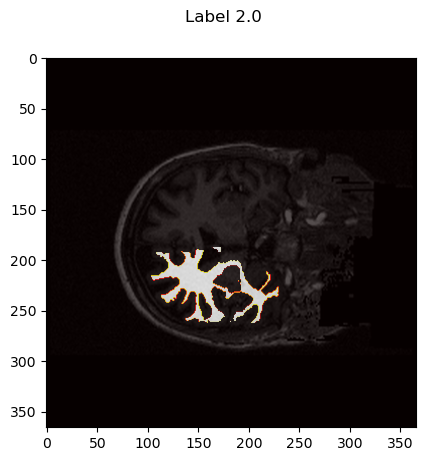

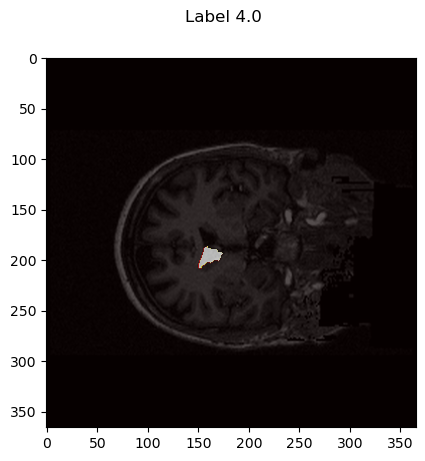

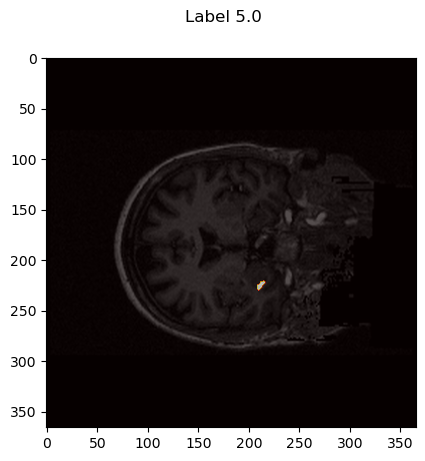

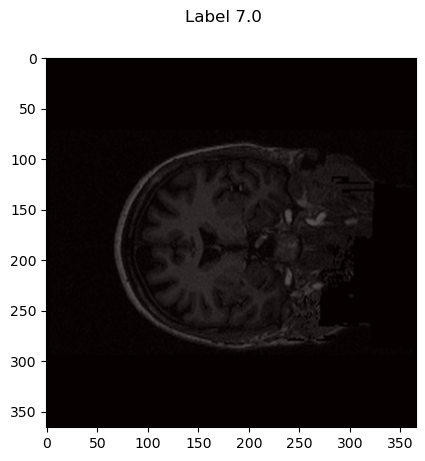

...

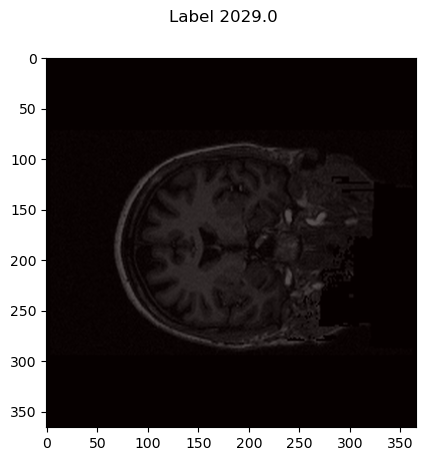

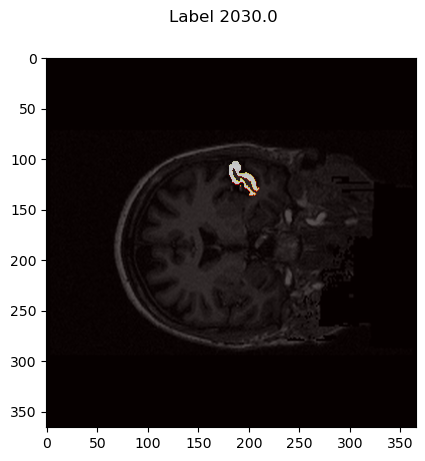

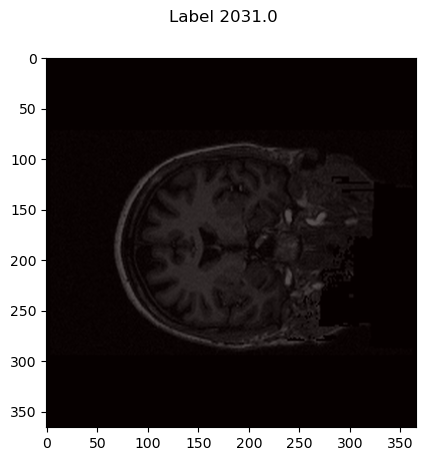

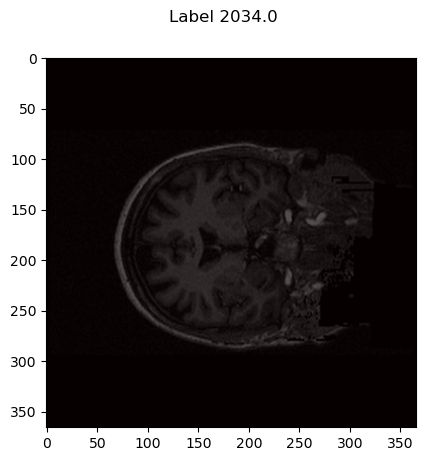

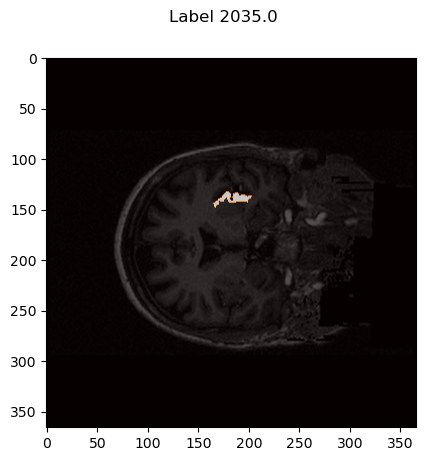

In [9]:
# 유니크한 레이블 값 찾기
unique_labels = np.unique(label_data)
print("Unique label values:", unique_labels)

# 유니크한 레이블 값 시각화
for label in unique_labels:
    mask = label_data == label
    if np.any(mask):
        plt.figure()
        plt.suptitle(f"Label {label}")
        plt.imshow(image_data[:, :, image_data.shape[2] // 2], cmap='gray')
        plt.imshow(mask[:, :, mask.shape[2] // 2], cmap='hot', alpha=0.7)
        plt.show()


In [19]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt


image_path = 'output.nii.gz'
label_path = 'aparc.DKTatlas+aseg.deep.nii.gz'

# 이미지와 레이블을 불러오기
image_nii = nib.load(image_path)
label_nii = nib.load(label_path)

# numpy 배열로 변환
image_data = image_nii.get_fdata()
label_data = label_nii.get_fdata()

# 히포캠퍼스 레이블 값을 설정 (14와 28이라고 가정)
hippocampus_labels = [17,53]
# 오버레이를 위해 두 개의 히포캠퍼스 레이블을 추출
hippocampus_data = np.isin(label_data, hippocampus_labels).astype(np.float32)


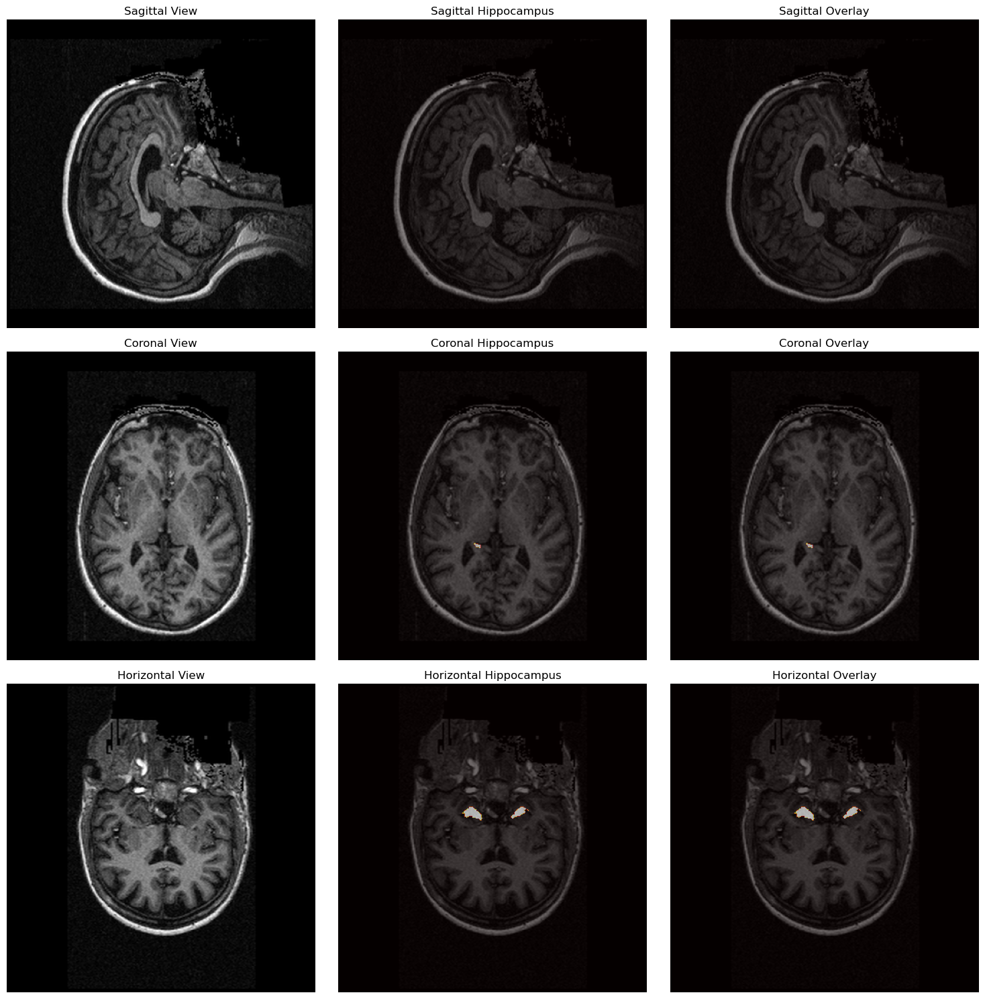

In [20]:
# Sagittal, Coronal, Horizontal 방향에 대한 중앙 슬라이스 인덱스 계산
sagittal_slice_idx = image_data.shape[0] // 2
coronal_slice_idx = image_data.shape[1] // 2
horizontal_slice_idx = image_data.shape[2] // 2

# 방향별 슬라이스 추출
sagittal_image_slice = image_data[sagittal_slice_idx, :, :]
coronal_image_slice = image_data[:, coronal_slice_idx, :]
horizontal_image_slice = image_data[:, :, horizontal_slice_idx]

sagittal_hippocampus_slice = hippocampus_data[sagittal_slice_idx, :, :]
coronal_hippocampus_slice = hippocampus_data[:, coronal_slice_idx, :]
horizontal_hippocampus_slice = hippocampus_data[:, :, horizontal_slice_idx]

# 시각화
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

# Sagittal 방향 시각화
axes[0, 0].imshow(sagittal_image_slice.T, cmap='gray', origin='lower')
axes[0, 0].set_title('Sagittal View')
axes[0, 0].axis('off')

axes[0, 1].imshow(sagittal_image_slice.T, cmap='gray', origin='lower')
axes[0, 1].imshow(sagittal_hippocampus_slice.T, cmap='hot', alpha=0.5, origin='lower')
axes[0, 1].set_title('Sagittal Hippocampus')
axes[0, 1].axis('off')

axes[0, 2].imshow(sagittal_image_slice.T, cmap='gray', origin='lower')
axes[0, 2].imshow(sagittal_hippocampus_slice.T, cmap='hot', alpha=0.5, origin='lower')
axes[0, 2].set_title('Sagittal Overlay')
axes[0, 2].axis('off')

# Coronal 방향 시각화
axes[1, 0].imshow(coronal_image_slice.T, cmap='gray', origin='lower')
axes[1, 0].set_title('Coronal View')
axes[1, 0].axis('off')

axes[1, 1].imshow(coronal_image_slice.T, cmap='gray', origin='lower')
axes[1, 1].imshow(coronal_hippocampus_slice.T, cmap='hot', alpha=0.5, origin='lower')
axes[1, 1].set_title('Coronal Hippocampus')
axes[1, 1].axis('off')

axes[1, 2].imshow(coronal_image_slice.T, cmap='gray', origin='lower')
axes[1, 2].imshow(coronal_hippocampus_slice.T, cmap='hot', alpha=0.5, origin='lower')
axes[1, 2].set_title('Coronal Overlay')
axes[1, 2].axis('off')

# Horizontal 방향 시각화
axes[2, 0].imshow(horizontal_image_slice.T, cmap='gray', origin='lower')
axes[2, 0].set_title('Horizontal View')
axes[2, 0].axis('off')

axes[2, 1].imshow(horizontal_image_slice.T, cmap='gray', origin='lower')
axes[2, 1].imshow(horizontal_hippocampus_slice.T, cmap='hot', alpha=0.6, origin='lower')
axes[2, 1].set_title('Horizontal Hippocampus')
axes[2, 1].axis('off')

axes[2, 2].imshow(horizontal_image_slice.T, cmap='gray', origin='lower')
axes[2, 2].imshow(horizontal_hippocampus_slice.T, cmap='hot', alpha=0.6, origin='lower')
axes[2, 2].set_title('Horizontal Overlay')
axes[2, 2].axis('off')

plt.tight_layout()
plt.show()
